# Libraries

In [1]:
import pandas as pd
import geopandas as gpd
import plotly.express as px
import shapely
import time

# Initialise Client API

Indicate the project used for making query

The GoogleSQL syntax reference can be found [here](https://cloud.google.com/bigquery/docs/reference/standard-sql/query-syntax)

In [2]:
from google.cloud import bigquery
client = bigquery.Client(project="treenyc-384104") # mark the created project id

# NYC Trees

In [7]:
query_tree = """
SELECT tree_id, block_id, tree_dbh, health, address, boroname, latitude, longitude x_sp, y_sp
FROM `bigquery-public-data.new_york_trees.tree_census_2015`
WHERE status = 'Alive'
"""

query_tree_job = client.query(query_tree)

In [8]:
tree_df = query_tree_job.to_dataframe()
print(tree_df.info())
tree_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 652173 entries, 0 to 652172
Data columns (total 9 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   tree_id   652173 non-null  Int64  
 1   block_id  652173 non-null  Int64  
 2   tree_dbh  652173 non-null  Int64  
 3   health    652172 non-null  object 
 4   address   652173 non-null  object 
 5   boroname  652173 non-null  object 
 6   latitude  652173 non-null  float64
 7   x_sp      652173 non-null  float64
 8   y_sp      652173 non-null  float64
dtypes: Int64(3), float64(3), object(3)
memory usage: 46.6+ MB
None


,tree_id,block_id,tree_dbh,health,address,boroname,latitude,x_sp,y_sp
0,68364,503349,34,Fair,1105 JEROME AVENUE,Bronx,40.834283,-73.924623,243238.1829
1,68361,503349,34,Good,1093 JEROME AVENUE,Bronx,40.833933,-73.924804,243110.3376
2,68351,503349,33,Good,1020 JEROME AVENUE,Bronx,40.832545,-73.925535,242604.5631
3,68162,503028,36,Good,901 ANDERSON AVENUE,Bronx,40.829972,-73.928948,241666.5289
4,162754,503115,1,Good,978 WOODYCREST AVENUE,Bronx,40.832019,-73.928393,242412.2803


# New York Road

In [14]:
query_geo = """
select *
from `bigquery-public-data.geo_us_roads.all_roads_36`
limit 100
"""
df_geo = client.query(query_geo).to_geodataframe(geography_column="road_geom")

In [15]:
df_geo = df_geo.set_index("full_name")
df_geo.to_csv("road-data/nyc_road_1.csv")
df_geo

,road_geom,road_id,route_type,mtfcc_feature_class_code
full_name,,,,
Co Rd 1,"LINESTRING (-74.56790 44.92248, -74.56783 44.9...",110789122675,C,S1200
Co Rd 1,"LINESTRING (-78.14710 42.77235, -78.14710 42.7...",110170654346,C,S1200
Co Rd 2,"LINESTRING (-77.11651 42.76333, -77.11630 42.7...",1104468059629,C,S1200
Co Rd 3,"LINESTRING (-78.05037 42.63211, -78.05064 42.6...",1106087915825,C,S1200
Co Rd 3,"LINESTRING (-76.96125 42.68655, -76.96130 42.6...",1104469015096,C,S1200
...,...,...,...,...
Co Rd 242,"LINESTRING (-77.01091 43.17607, -77.01091 43.1...",1104259455636,C,S1200
Co Rd 243,"LINESTRING (-76.98768 43.16408, -76.98783 43.1...",1104258972005,C,S1200
Co Rd 251,"LINESTRING (-77.70832 43.23132, -77.71001 43.2...",1104486033632,C,S1200


<Axes: >

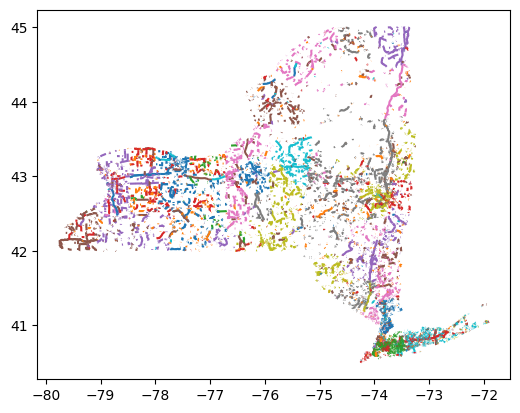

In [195]:
df_geo.plot(column="road_id")

In [187]:
fig = px.choropleth_mapbox(df_geo, geojson=df_geo.road_geom, locations=df_geo.index, color="road_id", 
                           mapbox_style="carto-positron", center={"lat": 40.689656, "lon": -74.045597}, 
                           height = 1000, width = 1600, zoom = 10)
fig.show()

KeyboardInterrupt: 

#  New York City Boundaries

In [27]:
query_geo = """
select *
from `bigquery-public-data.geo_us_boundaries.counties`
where county_name in ('Bronx', 'Kings', 'New York', 'Queens', 'Richmond') and state_fips_code = '36'
"""
df_geo = client.query(query_geo).to_geodataframe(geography_column="county_geom")
df_geo = df_geo.set_index("lsad_name")
df_geo.to_csv("road-data/nyc_geo_1.csv")
df_geo

,geo_id,state_fips_code,county_fips_code,county_gnis_code,county_name,lsad_code,fips_class_code,mtfcc_feature_class_code,csa_fips_code,cbsa_fips_code,met_div_fips_code,functional_status,area_land_meters,area_water_meters,int_point_lat,int_point_lon,int_point_geom,county_geom
lsad_name,,,,,,,,,,,,,,,,,,
Queens County,36081,36,36081,00974139,Queens,06,H6,G4020,408,35620,35614,C,281734463,179364919,40.658566,-73.838017,POINT (-73.8380168 40.6585662),"POLYGON ((-74.03813 40.53829, -74.04211 40.509..."
Bronx County,36005,36,36005,00974101,Bronx,06,H6,G4020,408,35620,35614,C,108909571,39687923,40.848711,-73.852939,POINT (-73.852939 40.8487111),"POLYGON ((-73.93365 40.88246, -73.93381 40.882..."
Kings County,36047,36,36047,00974122,Kings,06,H6,G4020,408,35620,35614,C,179671310,71098973,40.635045,-73.950640,POINT (-73.9506398 40.6350451),"POLYGON ((-74.05647 40.63171, -74.05663 40.627..."
New York County,36061,36,36061,00974129,New York,06,H6,G4020,408,35620,35614,C,58690498,28541727,40.776642,-73.970187,POINT (-73.9701871 40.7766419),"MULTIPOLYGON (((-74.04713 40.69054, -74.04729 ..."
Richmond County,36085,36,36085,00974141,Richmond,06,H6,G4020,408,35620,35614,C,148976885,115948458,40.561263,-74.139899,POINT (-74.1398995 40.5612628),"POLYGON ((-74.25909 40.49956, -74.25909 40.497..."


In [43]:
fig = px.choropleth_mapbox(df_geo, geojson=df_geo.county_geom, locations=df_geo.index, color="county_name", 
                           mapbox_style="carto-positron", center={"lat": 40.689656, "lon": -74.045597}, 
                           height = 600, width = 1200, zoom = 9.5, opacity=0.2)
fig.update_layout(margin = {'t': 0, 'b': 0, 'l': 0, 'r': 0})
fig.show()

# Combined Query of NYC Roads and Boundaries

In [63]:
query_geo = """
WITH 
boundaries AS (
    select county_name, county_geom, int_point_geom
    from `bigquery-public-data.geo_us_boundaries.counties`
    where county_name in ('Bronx', 'Kings', 'New York', 'Queens', 'Richmond') and state_fips_code = '36'),
roads as (
    SELECT full_name as road_name, road_geom
    FROM `bigquery-public-data.geo_us_roads.all_roads_36`)
SELECT *
FROM boundaries
JOIN roads
ON ST_WITHIN(roads.road_geom, boundaries.county_geom)
"""

df_geo = client.query(query_geo)

In [64]:
combined = df_geo.to_geodataframe(geography_column="road_geom")
combined.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 22034 entries, 0 to 22033
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   county_name     22034 non-null  object  
 1   county_geom     22034 non-null  object  
 2   int_point_geom  22034 non-null  object  
 3   road_name       18542 non-null  object  
 4   road_geom       22034 non-null  geometry
dtypes: geometry(1), object(4)
memory usage: 860.8+ KB


In [66]:
combined[["road_name", "county_name", "road_geom"]].to_parquet("road-data/nyc_combined_1.parquet")

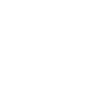

In [76]:
combined_geo = gpd.read_parquet("road-data/nyc_combined_1.parquet").set_index("road_name")
combined_geo.road_geom[1]

In [78]:
combined_geo.explore()

# OpenAq

In [57]:
query_aq ="""
select location_geom
from `bigquery-public-data.openaq.global_air_quality`
where country = 'US'
limit 10
"""
df_aq =  client.query(query_aq).to_dataframe()